# Nyoba

In [ ]:
import cv2
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
rotten = '/content/drive/My Drive/PCD_Proyek/Model/test/rotten'
unrotten = '/content/drive/My Drive/PCD_Proyek/Model/test/unrotten'

In [ ]:
# Menambahkan salt and pepper noise
def add_salt_and_pepper_noise(image, prob=0.02):
    output = np.copy(image)
    total_pixels = image.shape[0] * image.shape[1]
    num_salt = int(prob * total_pixels / 2)
    num_pepper = int(prob * total_pixels / 2)

    # Tambahkan salt (putih)
    coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape[:2]]
    output[coords[0], coords[1]] = 255

    # Tambahkan pepper (hitam)
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape[:2]]
    output[coords[0], coords[1]] = 0

    return output

rotten_folder = os.listdir(rotten)
rotten_folder.sort()

# Rotten
noisy_rotten = []
for file_name in rotten_folder:
    file_path = os.path.join(rotten, file_name)
    img = cv2.imread(file_path)
    if img is not None:
        noisy_img = add_salt_and_pepper_noise(img, prob=0.05)  # Bisa naikkan 0.05 biar jelas
        noisy_rotten.append((file_name, noisy_img))

# rotten_noise = '/content/drive/My Drive/PCD_Proyek/Model/hasil noise/noise_rotten_saltnpepper'
# os.makedirs(rotten_noise, exist_ok=True)

# for file_name, noisy_img in noisy_rotten:
#     save_path = os.path.join(rotten_noise, file_name)
#     cv2.imwrite(save_path, noisy_img)

# Unrotten
unrotten_folder = os.listdir(unrotten)
unrotten_folder.sort()

noisy_unrotten = []
for file_name in unrotten_folder:
    file_path = os.path.join(unrotten, file_name)
    img = cv2.imread(file_path)
    if img is not None:
        noisy_img = add_salt_and_pepper_noise(img, prob=0.05)
        noisy_unrotten.append((file_name, noisy_img))

# unrotten_noise = '/content/drive/My Drive/PCD_Proyek/Model/hasil noise/noise_unrotten_saltnpepper'
# os.makedirs(unrotten_noise, exist_ok=True)

# for file_name, noisy_img in noisy_unrotten:
#     save_path = os.path.join(unrotten_noise, file_name)
#     cv2.imwrite(save_path, noisy_img)

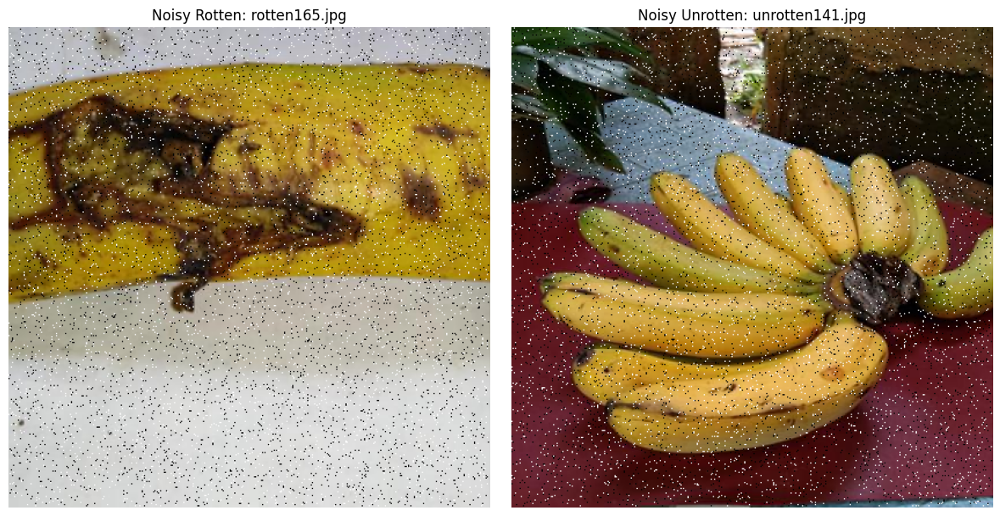

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Pilih indeks gambar
idx = 10

# Ambil gambar dari noisy_rotten dan noisy_unrotten
file_rotten, noisy_img_rotten = noisy_rotten[idx]
file_unrotten, noisy_img_unrotten = noisy_unrotten[idx]

# Tampilkan berdampingan
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(noisy_img_rotten, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Rotten: {file_rotten}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(noisy_img_unrotten, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Unrotten: {file_unrotten}")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Adaptive median filter
import cv2
import numpy as np

def adaptive_median_filter(image, S_max=7):
    padded_img = cv2.copyMakeBorder(image, S_max//2, S_max//2, S_max//2, S_max//2, cv2.BORDER_REFLECT)
    filtered_image = np.copy(image)

    height, width = image.shape[:2]
    is_color = len(image.shape) == 3

    for y in range(height):
        for x in range(width):
            for c in range(3) if is_color else range(1):
                S = 3
                while True:
                    half = S // 2
                    if is_color:
                        window = padded_img[y:y+S, x:x+S, c]
                    else:
                        window = padded_img[y:y+S, x:x+S]

                    Z_min = np.min(window)
                    Z_max = np.max(window)
                    Z_med = np.median(window)

                    A1 = Z_med - Z_min
                    A2 = Z_med - Z_max

                    if A1 > 0 and A2 < 0:
                        B1 = image[y, x, c] if is_color else image[y, x]
                        B2 = B1 - Z_min
                        B3 = B1 - Z_max

                        if B2 > 0 and B3 < 0:
                            out_val = B1
                        else:
                            out_val = Z_med
                        if is_color:
                            filtered_image[y, x, c] = out_val
                        else:
                            filtered_image[y, x] = out_val
                        break
                    else:
                        S += 2
                        if S > S_max:
                            if is_color:
                                filtered_image[y, x, c] = Z_med
                            else:
                                filtered_image[y, x] = Z_med
                            break
    return filtered_image.astype(np.uint8)

In [ ]:
# LASRNM filter
import numpy as np
import cv2

def lasrnm_filter_rgb(image, window_size=3):
    output = np.copy(image)
    if len(image.shape) == 2:  # grayscale
        return lasrnm_filter(image, window_size)

    for c in range(3):  # untuk R, G, B
        channel = image[:, :, c]
        filtered = lasrnm_filter(channel, window_size)
        output[:, :, c] = filtered

    return output.astype(np.uint8)

def lasrnm_filter(channel, window_size=3):
    padded = np.pad(channel, window_size//2, mode='reflect')
    output = np.copy(channel)
    height, width = channel.shape

    for y in range(height):
        for x in range(width):
            center = channel[y, x]

            if center == 0 or center == 255:
                half = window_size // 2
                y1, y2 = y, y + window_size
                x1, x2 = x, x + window_size
                local_window = padded[y:y+window_size, x:x+window_size]

                valid_pixels = local_window[(local_window > 0) & (local_window < 255)]

                if len(valid_pixels) > 0:
                    estimated = int(np.mean(valid_pixels))
                    output[y, x] = estimated
                else:
                    output[y, x] = center  # fallback
    return output

## Uji filter pada salah satu citra

<ipython-input-5-e84898047d38>:33: RuntimeWarning: overflow encountered in scalar subtract
  B3 = B1 - Z_max
<ipython-input-5-e84898047d38>:32: RuntimeWarning: overflow encountered in scalar subtract
  B2 = B1 - Z_min


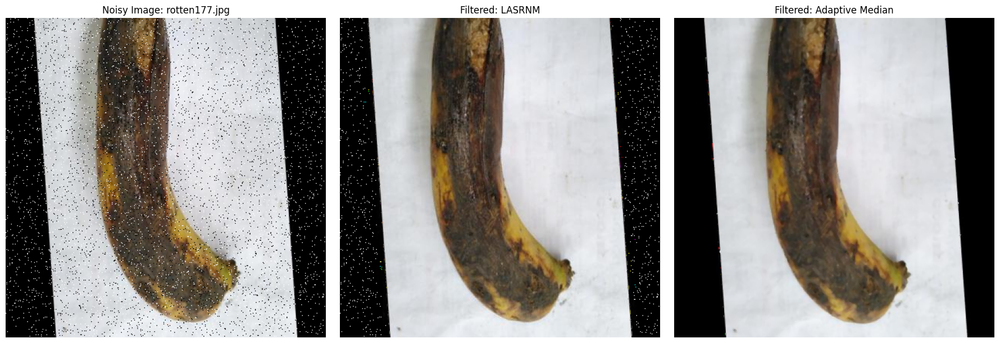

In [ ]:
# Penerapan filter pada citra
# ROtten
idx = 14
file_name, noisy_img = noisy_rotten[idx]

# Terapkan LASRNM
lasrnm_result_rotten = lasrnm_filter_rgb(noisy_img)

# Terapkan Adaptive Median
adaptive_result_rotten = adaptive_median_filter(noisy_img)

# Tampilkan hasil visual
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Image: {file_name}")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(lasrnm_result_rotten, cv2.COLOR_BGR2RGB))
plt.title("Filtered: LASRNM")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(adaptive_result_rotten, cv2.COLOR_BGR2RGB))
plt.title("Filtered: Adaptive Median")
plt.axis("off")

plt.tight_layout()
plt.show()


<ipython-input-5-e84898047d38>:33: RuntimeWarning: overflow encountered in scalar subtract
  B3 = B1 - Z_max
<ipython-input-5-e84898047d38>:32: RuntimeWarning: overflow encountered in scalar subtract
  B2 = B1 - Z_min


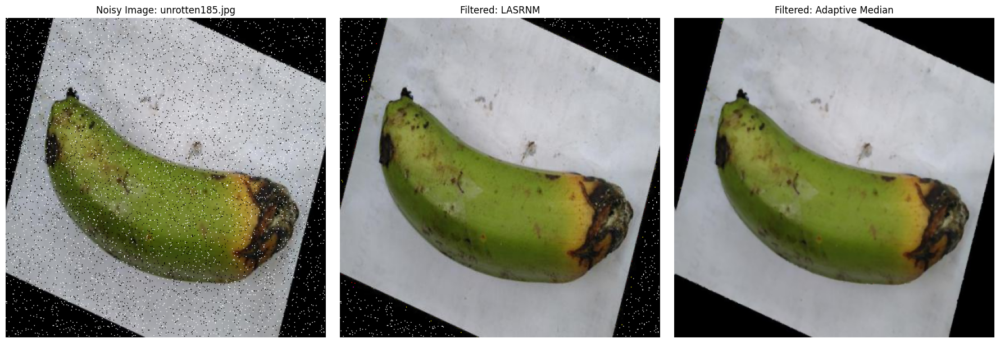

In [ ]:
# Unrotten
idx = 20
file_name, noisy_img = noisy_unrotten[idx]

# Terapkan LASRNM
lasrnm_result_unrotten = lasrnm_filter_rgb(noisy_img)

# Terapkan Adaptive Median
adaptive_result_unrotten = adaptive_median_filter(noisy_img)

# Tampilkan hasil visual
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Image: {file_name}")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(lasrnm_result_unrotten, cv2.COLOR_BGR2RGB))
plt.title("Filtered: LASRNM")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(adaptive_result_unrotten, cv2.COLOR_BGR2RGB))
plt.title("Filtered: Adaptive Median")
plt.axis("off")

plt.tight_layout()
plt.show()


Lebih bagus pakai Adaptive Median Filter

In [ ]:
import os
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error

def calculate_metrics(original, processed):
    # Ensure images have the same dimensions and data type
    processed_resized = cv2.resize(processed, (original.shape[1], original.shape[0]))
    mse_value = mean_squared_error(original, processed_resized)
    psnr_value = peak_signal_noise_ratio(original, processed_resized, data_range=255)
    return mse_value, psnr_value

# Penerapan filter pada citra
# ROtten
idx = 10
file_name, noisy_img = noisy_rotten[idx]

# Reconstruct the original file path
rotten_folder_path = '/content/drive/My Drive/PCD_Proyek/Model/test/rotten'
original_file_path = os.path.join(rotten_folder_path, file_name)

# Load the original image
original_img = cv2.imread(original_file_path)

if original_img is None:
    print(f"Error loading original image: {original_file_path}")
else:
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Assuming lasrnm_result_rotten and adaptive_result_rotten are already computed
    # from the noisy image in previous cells.

    # Ensure original_img is uint8 for metric calculation
    original_img = original_img.astype(np.uint8)

    mse_lasrnm, psnr_lasrnm = calculate_metrics(original_img, lasrnm_result_rotten)
    mse_adaptive, psnr_adaptive = calculate_metrics(original_img, adaptive_result_rotten)

    print(f"LASRNM - MSE: {mse_lasrnm:.2f}, PSNR: {psnr_lasrnm:.2f} dB")
    print(f"Adaptive Median - MSE: {mse_adaptive:.2f}, PSNR: {psnr_adaptive:.2f} dB")

LASRNM - MSE: 13632.93, PSNR: 6.78 dB
Adaptive Median - MSE: 13707.05, PSNR: 6.76 dB


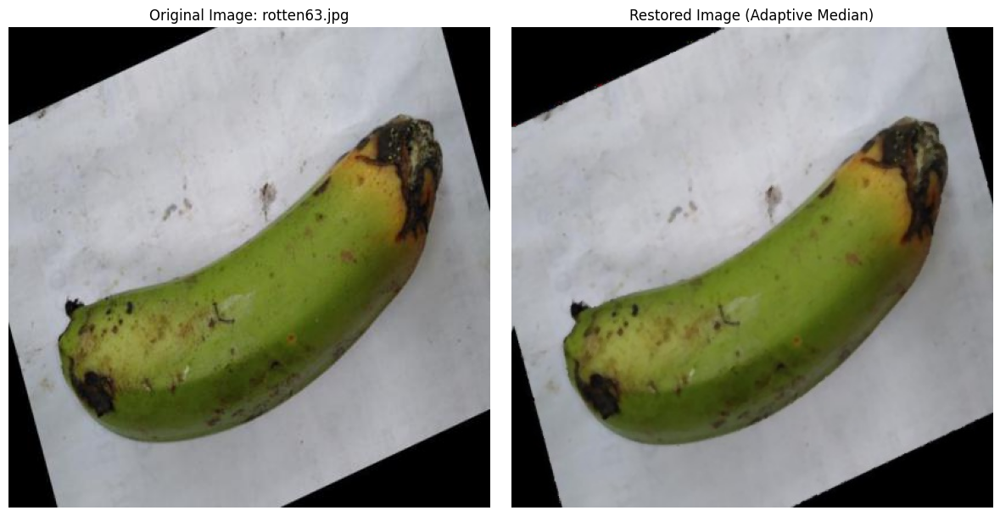

In [ ]:
# Menampilkan perbandingan citra
# Ambil 1 file acak dari folder hasil restorasi
sample_file = random.choice(get_random_files(base_restored_rotten))

# Path lengkap
orig_path = os.path.join(base_original_rotten, sample_file)
restored_path = os.path.join(base_restored_rotten, sample_file)

# Baca gambar
original = cv2.imread(orig_path)
restored = cv2.imread(restored_path)

# Konversi ke RGB untuk ditampilkan dengan matplotlib
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
restored_rgb = cv2.cvtColor(restored, cv2.COLOR_BGR2RGB)

# Tampilkan
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title(f"Original Image: {sample_file}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(restored_rgb)
plt.title("Restored Image (Adaptive Median)")
plt.axis("off")

plt.tight_layout()
plt.show()

#Salt and Pepper Noise

In [1]:
import cv2
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
rotten = '/content/drive/My Drive/PCD_Proyek/Model/test/rotten'
unrotten = '/content/drive/My Drive/PCD_Proyek/Model/test/unrotten'

In [4]:
# Menambahkan salt and pepper noise
def add_salt_and_pepper_noise(image, prob=0.02):
    output = np.copy(image)
    total_pixels = image.shape[0] * image.shape[1]
    num_salt = int(prob * total_pixels / 2)
    num_pepper = int(prob * total_pixels / 2)

    # Tambahkan salt (putih)
    coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape[:2]]
    output[coords[0], coords[1]] = 255

    # Tambahkan pepper (hitam)
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape[:2]]
    output[coords[0], coords[1]] = 0

    return output

rotten_folder = os.listdir(rotten)
rotten_folder.sort()

# Rotten
noisy_rotten = []
for file_name in rotten_folder:
    file_path = os.path.join(rotten, file_name)
    img = cv2.imread(file_path)
    if img is not None:
        noisy_img = add_salt_and_pepper_noise(img, prob=0.05)  # Bisa naikkan 0.05 biar jelas
        noisy_rotten.append((file_name, noisy_img))

# rotten_noise = '/content/drive/My Drive/PCD_Proyek/Model/hasil noise/noise_rotten_saltnpepper'
# os.makedirs(rotten_noise, exist_ok=True)

# for file_name, noisy_img in noisy_rotten:
#     save_path = os.path.join(rotten_noise, file_name)
#     cv2.imwrite(save_path, noisy_img)

# Unrotten
unrotten_folder = os.listdir(unrotten)
unrotten_folder.sort()

noisy_unrotten = []
for file_name in unrotten_folder:
    file_path = os.path.join(unrotten, file_name)
    img = cv2.imread(file_path)
    if img is not None:
        noisy_img = add_salt_and_pepper_noise(img, prob=0.05)
        noisy_unrotten.append((file_name, noisy_img))

# unrotten_noise = '/content/drive/My Drive/PCD_Proyek/Model/hasil noise/noise_unrotten_saltnpepper'
# os.makedirs(unrotten_noise, exist_ok=True)

# for file_name, noisy_img in noisy_unrotten:
#     save_path = os.path.join(unrotten_noise, file_name)
#     cv2.imwrite(save_path, noisy_img)

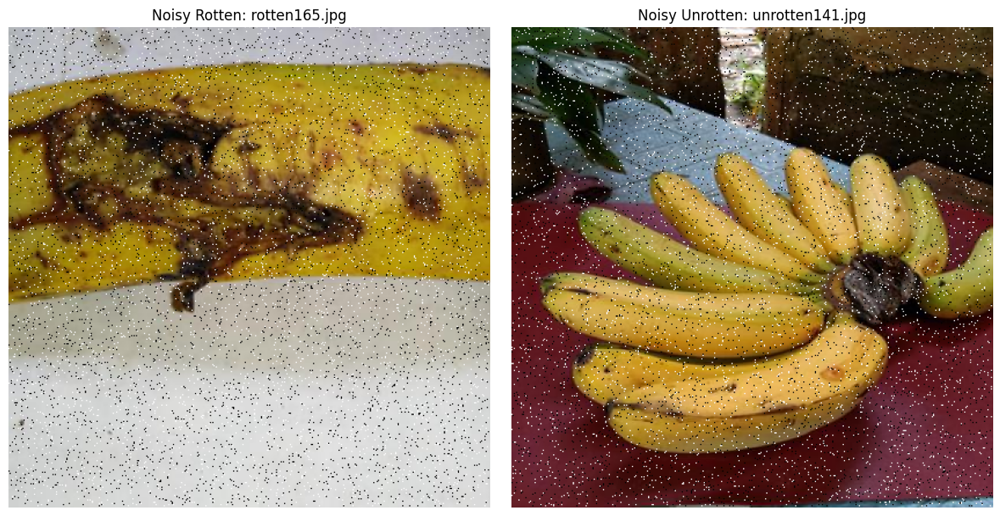

In [5]:
# Mengambil indeks gambar secara acak untuk melihat hasil noise yang diterapkan
# Pilih indeks gambar
idx = 10

# Ambil gambar dari noisy_rotten dan noisy_unrotten
file_rotten, noisy_img_rotten = noisy_rotten[idx]
file_unrotten, noisy_img_unrotten = noisy_unrotten[idx]

# Tampilkan berdampingan
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(noisy_img_rotten, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Rotten: {file_rotten}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(noisy_img_unrotten, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Unrotten: {file_unrotten}")
plt.axis('off')

plt.tight_layout()
plt.show()

In [6]:
# Fungsi Adaptive median filter
def adaptive_median_filter(image, S_max=7):
    padded_img = cv2.copyMakeBorder(image, S_max//2, S_max//2, S_max//2, S_max//2, cv2.BORDER_REFLECT)
    filtered_image = np.copy(image)

    height, width = image.shape[:2]
    is_color = len(image.shape) == 3

    for y in range(height):
        for x in range(width):
            for c in range(3) if is_color else range(1):
                S = 3
                while True:
                    half = S // 2
                    if is_color:
                        window = padded_img[y:y+S, x:x+S, c]
                    else:
                        window = padded_img[y:y+S, x:x+S]

                    Z_min = np.min(window)
                    Z_max = np.max(window)
                    Z_med = np.median(window)

                    A1 = Z_med - Z_min
                    A2 = Z_med - Z_max

                    if A1 > 0 and A2 < 0:
                        B1 = image[y, x, c] if is_color else image[y, x]
                        B2 = B1 - Z_min
                        B3 = B1 - Z_max

                        if B2 > 0 and B3 < 0:
                            out_val = B1
                        else:
                            out_val = Z_med
                        if is_color:
                            filtered_image[y, x, c] = out_val
                        else:
                            filtered_image[y, x] = out_val
                        break
                    else:
                        S += 2
                        if S > S_max:
                            if is_color:
                                filtered_image[y, x, c] = Z_med
                            else:
                                filtered_image[y, x] = Z_med
                            break
    return filtered_image.astype(np.uint8)

/tmp/ipython-input-6-2820419636.py:30: RuntimeWarning: overflow encountered in scalar subtract
  B3 = B1 - Z_max
/tmp/ipython-input-6-2820419636.py:29: RuntimeWarning: overflow encountered in scalar subtract
  B2 = B1 - Z_min


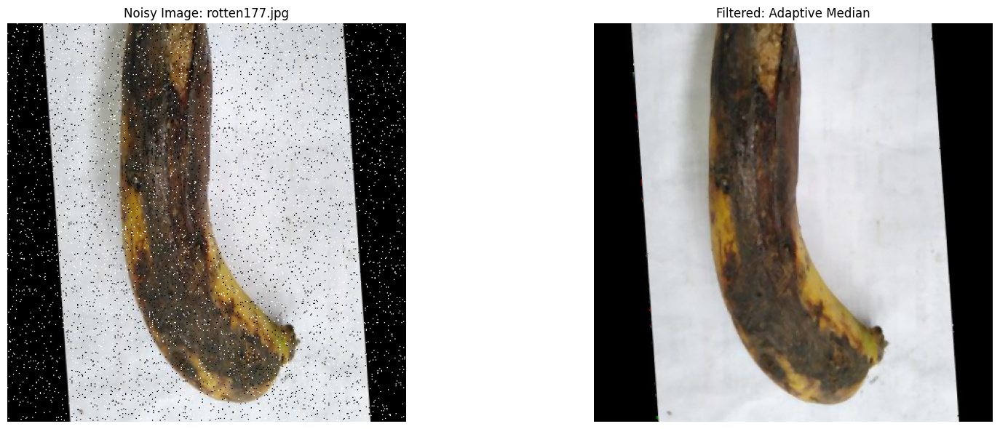

In [12]:
# Menguji filter pada salah satu citra secara acak
# Rotten
idx = 14
file_name, noisy_img = noisy_rotten[idx]

# Terapkan Adaptive Median
adaptive_result_rotten = adaptive_median_filter(noisy_img)

# Tampilkan hasil visual gambar yang terkena noise vs gambar hasil restorasi
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Image: {file_name}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(adaptive_result_rotten, cv2.COLOR_BGR2RGB))
plt.title("Filtered: Adaptive Median")
plt.axis("off")

plt.tight_layout()
plt.show()

/tmp/ipython-input-6-2820419636.py:30: RuntimeWarning: overflow encountered in scalar subtract
  B3 = B1 - Z_max
/tmp/ipython-input-6-2820419636.py:29: RuntimeWarning: overflow encountered in scalar subtract
  B2 = B1 - Z_min


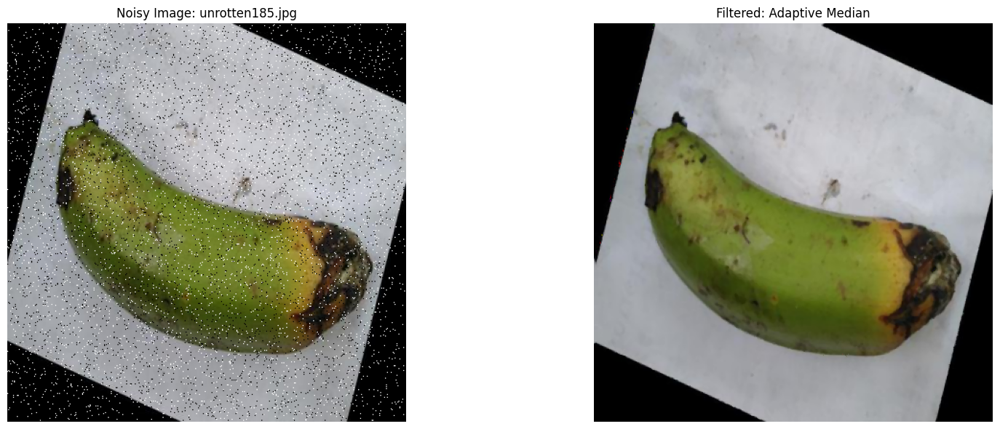

In [16]:
# Unrotten
idx = 20
file_name, noisy_img = noisy_unrotten[idx]

# Terapkan Adaptive Median
adaptive_result_unrotten = adaptive_median_filter(noisy_img)

# Tampilkan hasil visual
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.title(f"Noisy Image: {file_name}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(adaptive_result_unrotten, cv2.COLOR_BGR2RGB))
plt.title("Filtered: Adaptive Median")
plt.axis("off")

plt.tight_layout()
plt.show()

Penerapan adaptive median filter secara visual terbukti efektif dalam merestorasi citra yang terkena salt and pepper noise

## Menerapkan filter pada seluruh citra dalam folder

In [ ]:
# Buat list untuk menyimpan hasil
filtered_rotten_adaptive = []
filtered_unrotten_adaptive = []

# Proses semua gambar di noisy_rotten
for file_name, noisy_img in noisy_rotten:
    # Filter adaptive
    adaptive_result = adaptive_median_filter(noisy_img)
    filtered_rotten_adaptive.append((file_name, adaptive_result))

# Proses semua gambar di noisy_unrotten
for file_name, noisy_img in noisy_unrotten:
    # Filter adaptive
    adaptive_result = adaptive_median_filter(noisy_img)
    filtered_unrotten_adaptive.append((file_name, adaptive_result))

<ipython-input-5-e84898047d38>:33: RuntimeWarning: overflow encountered in scalar subtract
  B3 = B1 - Z_max
<ipython-input-5-e84898047d38>:32: RuntimeWarning: overflow encountered in scalar subtract
  B2 = B1 - Z_min


In [ ]:
def save_filtered_images(filtered_list, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    for file_name, img in filtered_list:
        save_path = os.path.join(save_dir, file_name)
        cv2.imwrite(save_path, img)

# Simpan semua hasil
save_filtered_images(filtered_rotten_adaptive, '/content/drive/My Drive/PCD_Proyek/Model/hasil restorasi/rotten_saltnpepper')
save_filtered_images(filtered_unrotten_adaptive, '/content/drive/My Drive/PCD_Proyek/Model/hasil restorasi/unrotten_saltnpepper')

In [ ]:
## Evaluasi hasil restorasi citra dengan MSE dan PNSR

In [17]:
import numpy as np
import math
import cv2

def calculate_mse(original, restored):
    mse = np.mean((original.astype(np.float64) - restored.astype(np.float64)) ** 2)
    return mse

def calculate_psnr(original, restored):
    mse = calculate_mse(original, restored)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

In [25]:
import random
from skimage.metrics import mean_squared_error as mse, peak_signal_noise_ratio as psnr
from tabulate import tabulate

# Path asli dan hasil restorasi
base_original_rotten = '/content/drive/MyDrive/PCD_Proyek/Model/test/rotten'
base_original_unrotten = '/content/drive/MyDrive/PCD_Proyek/Model/test/unrotten'
base_restored_rotten = '/content/drive/MyDrive/PCD_Proyek/Model/hasil restorasi/rotten_saltnpepper'
base_restored_unrotten = '/content/drive/MyDrive/PCD_Proyek/Model/hasil restorasi/unrotten_saltnpepper'

# Fungsi ambil file acak
def get_random_files(folder, n=5):
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    return random.sample(files, min(n, len(files)))

# Tabel hasil
mse_table = {}
psnr_table = {}

# Evaluasi per kategori
def evaluate_restored_images(label, original_folder, restored_folder, files):
    for filename in files:
        orig_path = os.path.join(original_folder, filename)
        restored_path = os.path.join(restored_folder, filename)

        orig = cv2.imread(orig_path)
        restored = cv2.imread(restored_path)

        if orig is None or restored is None:
            print(f"Gagal membaca gambar {filename}")
            continue

        full_name = f"{label}/{filename}"
        mse_table[full_name] = mse(orig, restored)
        psnr_table[full_name] = psnr(orig, restored, data_range=255)

# Evaluasi
evaluate_restored_images('rotten', base_original_rotten, base_restored_rotten, get_random_files(base_restored_rotten))
evaluate_restored_images('unrotten', base_original_unrotten, base_restored_unrotten, get_random_files(base_restored_unrotten))

# Tampilkan tabel
headers = ["Nama Citra", "MSE", "PSNR"]
rows = []

for filename in mse_table:
    rows.append([
        filename,
        f"{mse_table[filename]:.2f}",
        f"{psnr_table[filename]:.2f} dB"
    ])

# Tambah rata-rata
avg_mse = np.mean(list(mse_table.values()))
avg_psnr = np.mean(list(psnr_table.values()))
rows.append(["Rata-rata", f"{avg_mse:.2f}", f"{avg_psnr:.2f} dB"])

print("\n=== Evaluasi Adaptive Median (Salt & Pepper) ===")
print(tabulate(rows, headers=headers, tablefmt="grid"))


=== Evaluasi Adaptive Median (Salt & Pepper) ===
+--------------------------+--------+----------+
| Nama Citra               |    MSE | PSNR     |
+==========================+========+==========+
| rotten/rotten369.jpg     | 130.33 | 26.98 dB |
+--------------------------+--------+----------+
| rotten/rotten99.jpg      | 327.9  | 22.97 dB |
+--------------------------+--------+----------+
| rotten/rotten16.jpg      | 140.53 | 26.65 dB |
+--------------------------+--------+----------+
| rotten/rotten437.jpg     |  96.34 | 28.29 dB |
+--------------------------+--------+----------+
| rotten/rotten328.jpg     | 121.06 | 27.30 dB |
+--------------------------+--------+----------+
| unrotten/unrotten324.jpg |  68.45 | 29.78 dB |
+--------------------------+--------+----------+
| unrotten/unrotten448.jpg |  79.63 | 29.12 dB |
+--------------------------+--------+----------+
| unrotten/unrotten20.jpg  |  43.01 | 31.79 dB |
+--------------------------+--------+----------+
| unrotten/unrotten

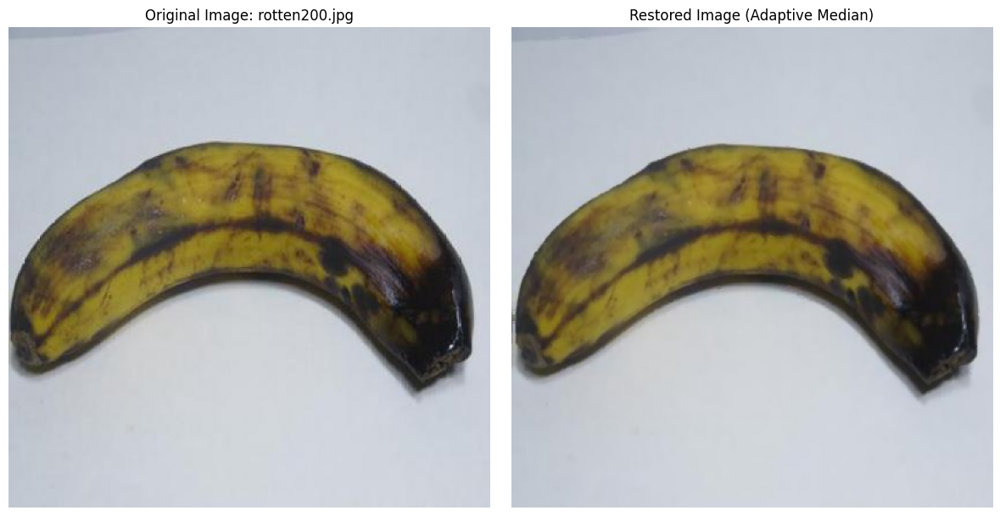

In [27]:
# Menampilkan perbandingan citra sebelum dengan setelah restorasi
# Ambil 1 file acak dari folder hasil restorasi
sample_file = random.choice(get_random_files(base_restored_rotten))

# Path lengkap
orig_path = os.path.join(base_original_rotten, sample_file)
restored_path = os.path.join(base_restored_rotten, sample_file)

# Baca gambar
original = cv2.imread(orig_path)
restored = cv2.imread(restored_path)

# Konversi ke RGB untuk ditampilkan dengan matplotlib
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
restored_rgb = cv2.cvtColor(restored, cv2.COLOR_BGR2RGB)

# Tampilkan
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title(f"Original Image: {sample_file}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(restored_rgb)
plt.title("Restored Image (Adaptive Median)")
plt.axis("off")

plt.tight_layout()
plt.show()

Hasil filtering sudah bagus walaupun kualitas citra turun dari gambar aslinya. Rata-rata error yang ditampilkan MSE menunjukkan kesalahan cukup kecil yang menandakan restorasi berhasil memperbaiki noise. Nilai rata-rata PSRN juga menunjukkan hasil restorasi tergolong baik

In [29]:
# Ambil 5 gambar acak dari folder
def get_random_images(folder, n=5):
    all_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    return random.sample(all_files, min(n, len(all_files)))

# Tampilkan perbandingan citra (original, noisy, restored)
def display_comparison(folder, label, sample_files):
    for filename in sample_files:
        path = os.path.join(folder, filename)
        original = cv2.imread(path)
        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

        noisy = add_salt_and_pepper_noise(original)
        restored = adaptive_median_filter(noisy)

        # Hitung metrik
        mse_val = mse(original, restored)
        psnr_val = psnr(original, restored, data_range=255)

        # Tampilkan gambar
        plt.figure(figsize=(12, 4))
        plt.suptitle(f"{label.upper()} - {filename}", fontsize=14)

        plt.subplot(1, 3, 1)
        plt.imshow(original)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(noisy)
        plt.title("Noisy")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(restored)
        plt.title(f"Restored\nMSE: {mse_val:.2f} | PSNR: {psnr_val:.2f} dB")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

# Path folder
rotten_path = '/content/drive/MyDrive/PCD_Proyek/Model/test/rotten'
unrotten_path = '/content/drive/MyDrive/PCD_Proyek/Model/test/unrotten'

# Ambil dan tampilkan 5 rotten + 5 unrotten
rotten_samples = get_random_images(rotten_path, 5)
unrotten_samples = get_random_images(unrotten_path, 5)

print("=== ROTTEN SAMPLES ===")
display_comparison(rotten_path, "rotten", rotten_samples)

print("=== UNROTTEN SAMPLES ===")
display_comparison(unrotten_path, "unrotten", unrotten_samples)

Output hidden; open in https://colab.research.google.com to view.

=== ROTTEN SAMPLES ===


/tmp/ipython-input-6-2820419636.py:30: RuntimeWarning: overflow encountered in scalar subtract
  B3 = B1 - Z_max
/tmp/ipython-input-6-2820419636.py:29: RuntimeWarning: overflow encountered in scalar subtract
  B2 = B1 - Z_min


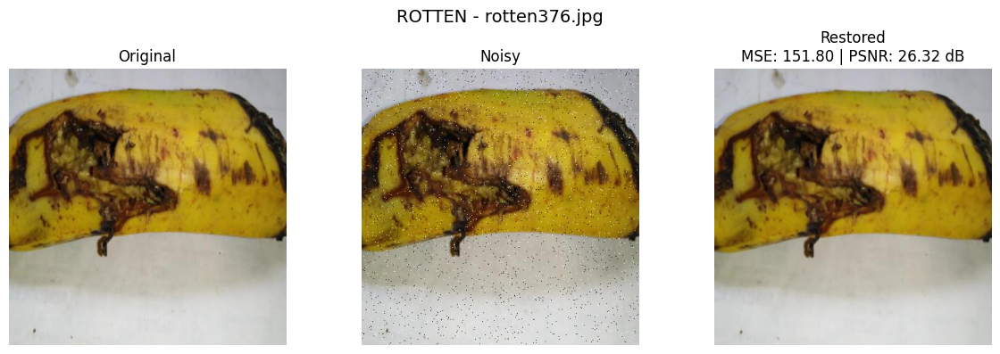

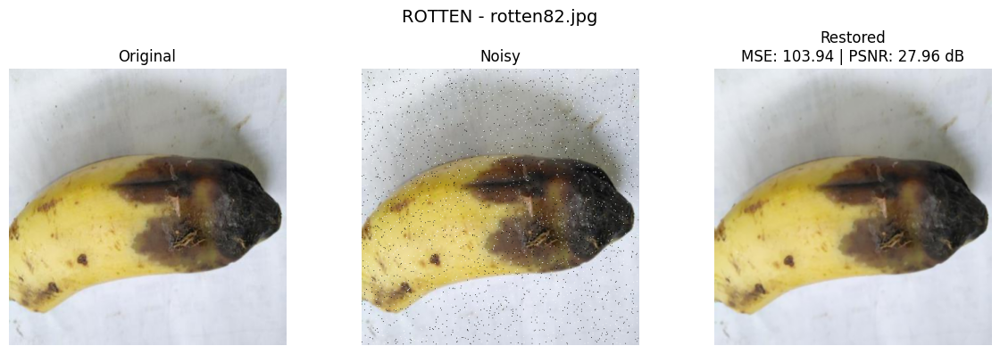

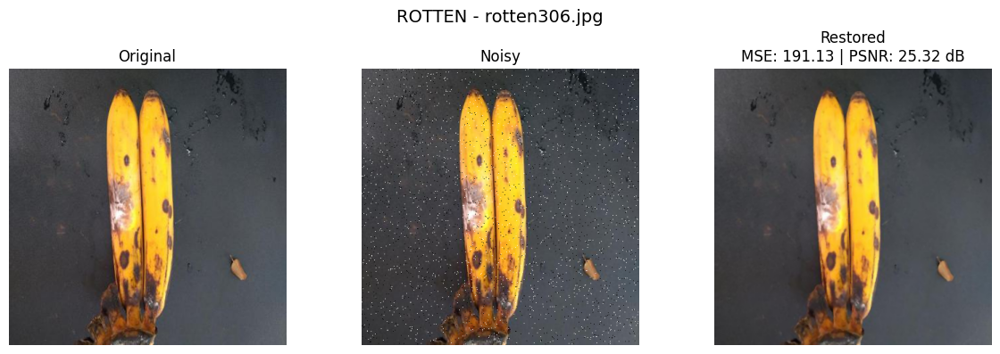

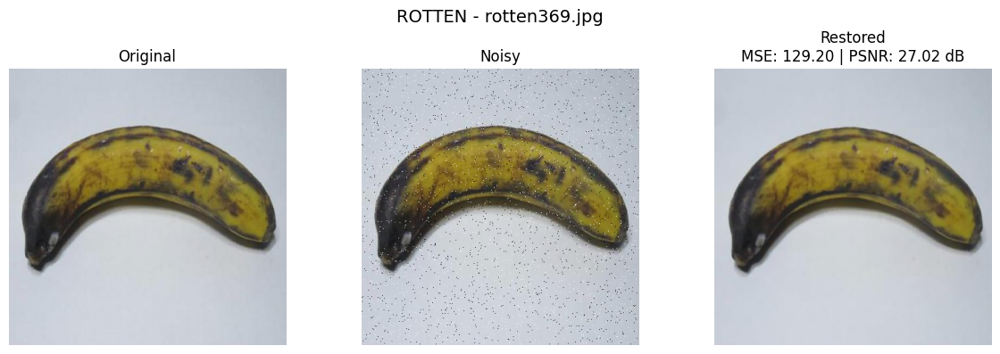

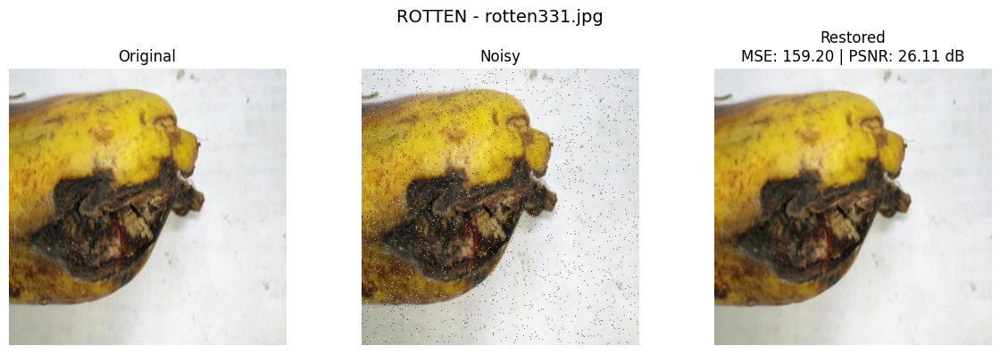

=== UNROTTEN SAMPLES ===


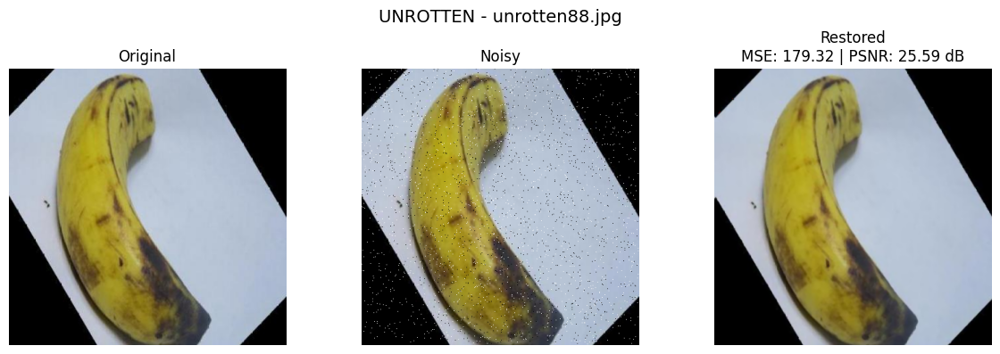

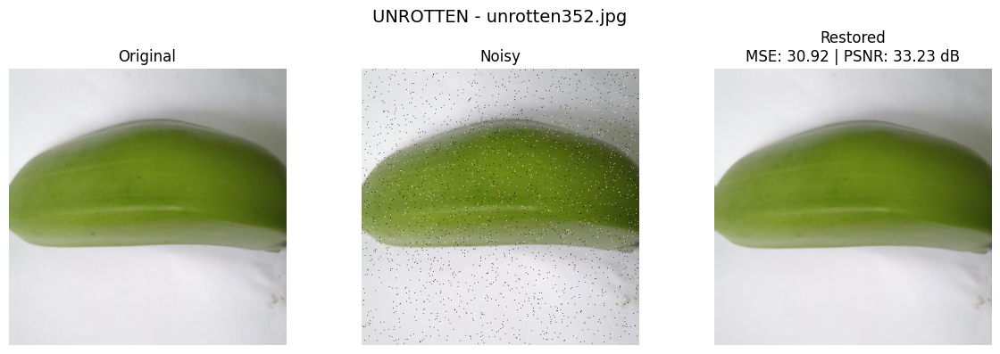

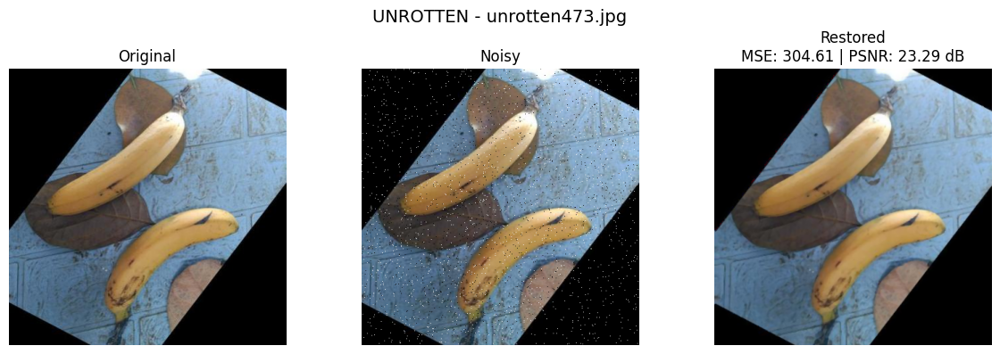

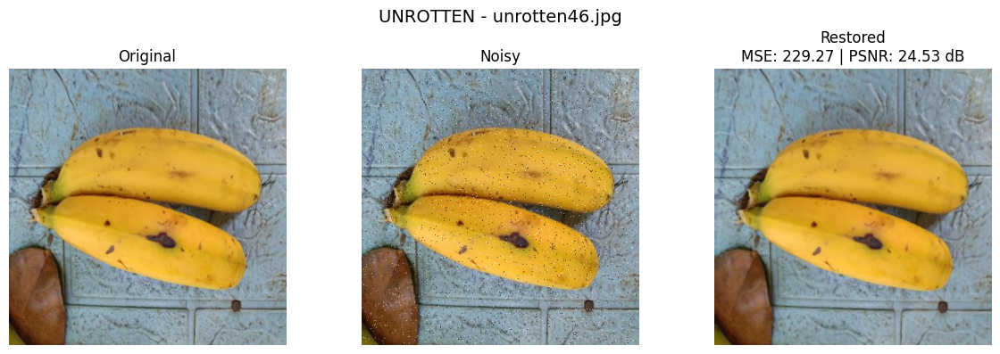

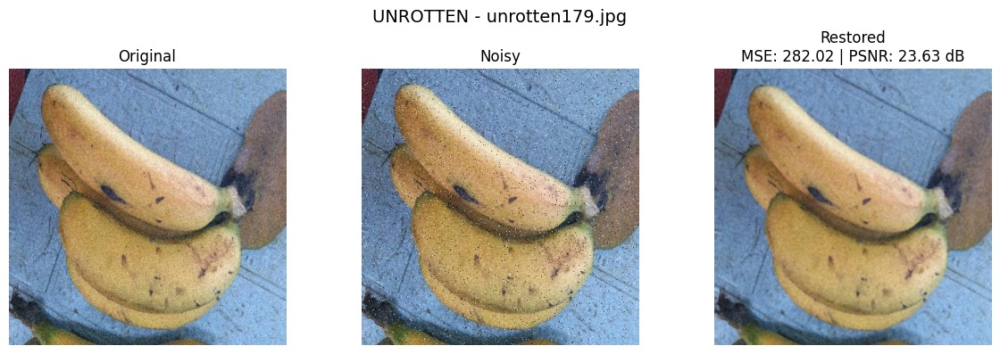

In [30]:
# Ambil 5 gambar acak dari folder
def get_random_images(folder, n=5):
    all_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    return random.sample(all_files, min(n, len(all_files)))

# Tampilkan perbandingan citra (original, noisy, restored)
def display_comparison(folder, label, sample_files):
    for filename in sample_files:
        path = os.path.join(folder, filename)
        original = cv2.imread(path)
        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

        noisy = add_salt_and_pepper_noise(original)
        restored = adaptive_median_filter(noisy)

        # Hitung metrik
        mse_val = mse(original, restored)
        psnr_val = psnr(original, restored, data_range=255)

        # Tampilkan gambar
        plt.figure(figsize=(12, 4))
        plt.suptitle(f"{label.upper()} - {filename}", fontsize=14)

        plt.subplot(1, 3, 1)
        plt.imshow(original)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(noisy)
        plt.title("Noisy")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(restored)
        plt.title(f"Restored\nMSE: {mse_val:.2f} | PSNR: {psnr_val:.2f} dB")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

# Path folder
rotten_path = '/content/drive/MyDrive/PCD_Proyek/Model/test/rotten'
unrotten_path = '/content/drive/MyDrive/PCD_Proyek/Model/test/unrotten'

# Ambil dan tampilkan 5 rotten + 5 unrotten
rotten_samples = get_random_images(rotten_path, 5)
unrotten_samples = get_random_images(unrotten_path, 5)

print("=== ROTTEN SAMPLES ===")
display_comparison(rotten_path, "rotten", rotten_samples)

print("=== UNROTTEN SAMPLES ===")
display_comparison(unrotten_path, "unrotten", unrotten_samples)